<a href="https://colab.research.google.com/github/KVKTRAN/CANDEV_4044/blob/main/CanDev2022.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install rasterio

In [ ]:
import numpy as np
import pandas as pd

In [ ]:
import matplotlib.pyplot as plt

In [ ]:
import rasterio

In [ ]:
from google.colab import files
uploaded = files.upload()

In [ ]:
import io
df_AIS = pd.read_csv(io.BytesIO(uploaded['AIS_2020_01_clean.csv']))
df_AIS[df_AIS['MMSI'] == 219265000].head()

In [ ]:
#mine >:)

## Vessel - Right Whale Collision Lethality Model

In [ ]:
data_points = {0: 0,
3: 0.025813692,
5: 0.053872054,
7: 0.119191919,
9: 0.236139169,
11: 0.412794613,
13: 0.621997755,
15: 0.797306397,
17: 0.908417508,
19: 0.964534231,
21: 0.992592593,
23: 0.999775533}

def leth_fnc(speed):
  
  if (speed < 0):
    return 0
  elif (speed > 23):
    return 0.999775533
  else:
    return np.interp(speed, list(data_points.keys()), list(data_points.values()))

leth_fnc(15)

0.797306397

## Whale Habitats - North American Atlantic Coastline

In [ ]:
!unzip /content/Pseudo_Habitat_Suitability_Models.zip

In [ ]:
raster_data = rasterio.open('/content/Pseudo_Habitat_Suitability_Models/NARW_Jan_Norm.tif')
# /content/Pseudo_Habitat_Suitability_Models/NARW_Apr_Norm.tif

In [ ]:
raster = raster_data.read(1)

print('Raster CRS: %s' % raster_data.crs)
print('\nRaster bounds: %s' % str(raster_data.bounds))

print('\nRaster grid data type: %s' % type(raster))
print('Raster grid dimensions: %s' % str(raster.shape))

Raster CRS: EPSG:4326

Raster bounds: BoundingBox(left=-82.6965062291361, bottom=22.967478463308478, right=-53.403205659379964, top=52.89074248617765)

Raster grid data type: <class 'numpy.ndarray'>
Raster grid dimensions: (380, 372)


In [ ]:
rasterio.plot.show(raster)

In [ ]:
#risk = habitat_suitability * lethality * 100

In [ ]:
!unzip /content/AIS.zip

In [ ]:
import pandas as pd
df = pd.read_csv('/content/AIS_2020_04_clean.csv')

# Take 1001 records with Lat Lon and Sog columns only
# drop all na
data = df.loc[0:1000]
heat_df = data[['Lat', 'Lon', 'SOG']]
heat_df = heat_df.dropna(axis=0, subset=['Lat','Lon'])

# convert to heat data 
heat_data = [[row['Lat'], row['Lon'], row['SOG']] for index, row in heat_df.iterrows()]

In [ ]:
df.describe()
#SOG - speed

,MMSI,Lat,Lon,SOG,COG,Heading,VesselType,Status,Length,Width,Draft,Cargo
count,3.361430e+05,336143.000000,336143.000000,336143.000000,336143.000000,336143.000000,318898.000000,226213.000000,306500.000000,279615.000000,103240.000000,80125.000000
mean,3.739988e+08,42.160228,-70.633436,2.169681,206.799802,402.020902,48.420279,3.742844,42.613922,9.829469,5.240489,54.229629
std,6.054084e+07,0.908333,0.869684,4.313721,112.251226,160.616926,23.377916,5.049484,52.611352,7.315658,3.571501,22.552125
min,1.659816e+08,40.000050,-71.999980,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-12.700000,0.000000
25%,3.670642e+08,41.536480,-71.051040,0.000000,115.100000,273.000000,30.000000,0.000000,20.000000,6.000000,3.200000,50.000000
50%,3.674283e+08,41.782910,-70.913980,0.000000,227.300000,511.000000,31.000000,1.000000,27.000000,8.000000,3.900000,52.000000
75%,3.676930e+08,42.521400,-70.279090,2.500000,300.200000,511.000000,60.000000,5.000000,35.000000,10.000000,5.600000,70.000000
max,9.726042e+08,47.589800,-66.000420,102.300000,360.000000,511.000000,90.000000,15.000000,352.000000,60.000000,22.400000,99.000000


# Examining ship behavior
- The types of ship we will focus on are cargo, tanker, tug tow, passenger and military
- Military boats travel at low speeds and are infrequent. They are not a risk factor.
- Passenger boats travel at high speeds but nearby ports. It is unlikely a small boat can injure a whale. We suggest passenger boats exercise caution but are not a risk factor.
- Tug boats travel at a high speeds and are infrequent. Tug boats are also small boats. We decided that they are not a risk factor.
- Cargo ships and Tanker ships are the most dangerous. Both types of boats travel at 10-15 knots which is extremly lethal to whales. Moreover, their shipping lanes heavily intersect with areas of high whale suitability especially at the Gulf of Maine and surrounding port of Boston. Moreover, large ships are known to under report whale collision due to its size and lack of sensory equipment. We suggest detouring shipping lanes around the Gulf of Maine and port of Boston as well as equipping each ship in that area with sonar sensors to detect whales nearby.

# Data cleaning
- we have removed ships below 1 knot as they are likely either docked or slow enough to not harm anything. An important consequence is that the speed of cargo ship has been reclassified from non-lethal to lethal.
- the raster plot was not accurately drawn on the map and offsets were required and important!

In [ ]:
df.VesselType.unique()
#7x cargo
#8x tanker
#31,52 tug tow
#6x passenger
#35 military

array([70., 90., 80., 30., 31., 34., 60., 69., 50.,  0., 52., 51., 33.,
       59., 67., 89., 55., 35., 81., 71., 56., 53., 79.])

In [ ]:
df = df[df["SOG"] > 1]
df_cargo = df[(df["VesselType"] >= 70) & (df["VesselType"] <= 79)]
df_tanker = df[(df["VesselType"] >= 80) & (df["VesselType"] <= 89)]
df_tugtow = df[(df["VesselType"] >= 31) | (df["VesselType"] <= 52)]
df_passenger = df[(df["VesselType"] >= 60) & (df["VesselType"] <= 69)]
df_military = df[(df["VesselType"] == 35)]

In [ ]:
y_off = -1.5
x_off = 0
map_bounds = [[raster_data.bounds.top+y_off, raster_data.bounds.left+x_off], [raster_data.bounds.bottom+y_off, raster_data.bounds.right+x_off]]

## Speed by boat type
- Cargos and Tankers consistently travel at a high and lethal speed
- Tug tow, passenger are fast but small boats
- Military are do not generally travel fast

In [ ]:
print(f"cargo boat type average speed is: {df_cargo['SOG'].mean()}")
print(f"tanker boat type average speed is: {df_tanker['SOG'].mean()}")
print(f"tug tow boat type average speed is: {df_tugtow['SOG'].mean()}")
print(f"passenger boat type average speed is: {df_passenger['SOG'].mean()}")
print(f"military boat type average speed is: {df_military['SOG'].mean()}")

cargo boat type average speed is: 11.285195530726282
tanker boat type average speed is: 11.309586888190413
tug tow boat type average speed is: 7.747425246257858
passenger boat type average speed is: 10.641431334622832
military boat type average speed is: 3.8


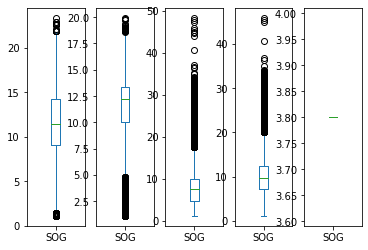

In [ ]:
fig, ax = plt.subplots(1,5)
df_cargo['SOG'].plot.box(ax=ax[0)
df_tanker['SOG'].plot.box(ax=ax[1])
df_tugtow['SOG'].plot.box(ax=ax[2])
df_passenger['SOG'].plot.box(ax=ax[3])
df_military['SOG'].plot.box(ax=ax[4])
#prior to subsetting ship speed to > 1, the average speed of cargo was in the 5-10 range and would have been classified as non-lethal. This shows that the data cleaning step is important!

## Examine behaviour of passenger ships over 10 knots



In [ ]:
gordon_map = folium.Map(location=[0,0], tiles="OpenStreetMap", zoom_start=2)
speed_threshold = 10
df = df_passenger

for id in df[(df["SOG"] > speed_threshold)]["MMSI"].unique():
  temp = df[(df["MMSI"]==id) & (df["SOG"] > speed_threshold)]
  for index, row in temp.iterrows():
    folium.CircleMarker(location=(row["Lat"], row["Lon"]),bounds=map_bounds,opacity=1,color='green').add_to(gordon_map)

folium.raster_layers.ImageOverlay(raster,
                                  bounds=map_bounds,
                                  colormap=lambda feature: (0,0,0,0) if feature == 0 else ((10,0,0,1) if feature > 0.1 else (0,0,0,2))
                                  ).add_to(gordon_map)
gordon_map

## Examine behavior of tug tow over 40 knots

In [ ]:
gordon_map = folium.Map(location=[0,0], tiles="OpenStreetMap", zoom_start=2)
speed_threshold = 40
df = df_tugtow

for id in df[(df["SOG"] > speed_threshold)]["MMSI"].unique():
  temp = df[(df["MMSI"]==id) & (df["SOG"] > speed_threshold)]
  for index, row in temp.iterrows():
    folium.CircleMarker(location=(row["Lat"], row["Lon"]),bounds=map_bounds,opacity=1,color='green').add_to(gordon_map)

folium.raster_layers.ImageOverlay(raster,
                                  bounds=map_bounds,
                                  colormap=lambda feature: (256,256,256,0) if feature == 0 else ((256,0,0,0.5) if feature > 0.1 else (0,0,0,0.1))
                                  ).add_to(gordon_map)


In [ ]:
gordon_map

## examine behavior of cargo ships

The shipping lane going into the port of Boston interesects with the high likelihood zone. More enforcement in this area is recommended.

In [ ]:
gordon_map = folium.Map(location=[0,0], tiles="OpenStreetMap", zoom_start=2)
speed_threshold = 1
df = df_cargo

for id in df[(df["SOG"] > speed_threshold)]["MMSI"].unique():  
  temp = df[(df["MMSI"]==id) & (df["SOG"] > speed_threshold)]
  for index, row in temp.iterrows():
    folium.CircleMarker(location=(row["Lat"], row["Lon"]),bounds=map_bounds,opacity=0.2,color='green').add_to(gordon_map)

folium.raster_layers.ImageOverlay(raster,
                                  bounds=map_bounds,
                                  colormap=lambda feature: (256,256,256,0) if feature == 0 else ((256,0,0,0.5) if feature > 0.1 else (0,0,0,0.1))
                                  ).add_to(gordon_map)
gordon_map

## Examining behavior of tanker ships

In [ ]:
gordon_map = folium.Map(location=[0,0], tiles="OpenStreetMap", zoom_start=2)
speed_threshold = 1
df = df_tanker

for id in df[(df["SOG"] > speed_threshold)]["MMSI"].unique():  
  temp = df[(df["MMSI"]==id) & (df["SOG"] > speed_threshold)]
  for index, row in temp.iterrows():
    folium.CircleMarker(location=(row["Lat"], row["Lon"]),bounds=map_bounds,opacity=0.2,color='green').add_to(gordon_map)

folium.raster_layers.ImageOverlay(raster,
                                  bounds=map_bounds,
                                  colormap=lambda feature: (256,256,256,0) if feature == 0 else ((256,0,0,0.5) if feature > 0.1 else (0,0,0,0.1))
                                  ).add_to(gordon_map)
gordon_map

## need cleaning

In [ ]:
dst_crs = 'EPSG:4326' 

# [[top, left], [bottom, right]]
# map_bounds = [[raster_data.bounds.top, raster_data.bounds.left], [raster_data.bounds.bottom, raster_data.bounds.right]]
map_bounds = [[52.89074248617764, -82.6965062291361], 
              [22.9352776326434, -53.427044387514854]]

# create map
mymap = folium.Map(location=[0,0], tiles="OpenStreetMap", zoom_start=2)

# add Heat map
folium.plugins.HeatMap(heat_data).add_to(mymap)

def style_function(feature):
  if feature == 0:
    return (256,256,256,0)
  elif feature > 0.1:
    return (256,0,0,1)
  else:
    return (0,0,0,0.1)

# lambda feature: (256,256,256,0) if feature == 0 else ((256,0,0,1) if feature > 0.1 else (0,0,0,0.1))
# add raster layer to the map 
# raster variable is  what we load from rasterio defined above
folium.raster_layers.ImageOverlay(raster,bounds=map_bounds,colormap=style_function).add_to(mymap)

# add layer control to the map
folium.LayerControl().add_to(mymap)


In [ ]:
mymap

# Suggestions
- we suggest adding sonar to large ships since large ships tend to under report collisions
- if we collect collision data, we can cross check the effectiveness of the habitat zone and where whales really tend to be